# Traffic Light Detection
using Tensorflow v2 Object Detection API

## Environment Setup

### Install required libraries

In [37]:
# !pip install -q tensorflow-gpu==1.14
!pip install -q pillow lxml jupyter matplotlib cython pandas contextlib2

#!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk
!apt-get install -qq protobuf-compiler
!pip install -q pycocotools tf_slim

### Set configurations

In [38]:
# Repo URL
repo_url = 'https://github.com/yuki678/driving-object-detection'

## Number of training and evaluation steps (override the setup in .config)
## Do not use these parameters as the lerning rate strategy would be different between models
# num_steps = 10000
# num_eval_steps = 500


# Models
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'model_path': '/models/my_ssd_mobilenet_v2/',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 12
    },
    'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
        'model_path': '/models/my_faster_rcnn_inception_v2/',
        'pipeline_file': 'faster_rcnn_inception_v2_pets.config',
        'batch_size': 12
    },
    'ssd_mobilenet_v2_fpn': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'model_path': '/models/my_ssd_mobilenet_v2_fpnlite/',
        'pipeline_file': 'pipeline.config',
        'batch_size': 16
    }
}

# Select a model to use.
selected_model = 'ssd_mobilenet_v2_fpn'

model_name = MODELS_CONFIG[selected_model]['model_name']
model_path = MODELS_CONFIG[selected_model]['model_path']
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']
batch_size = MODELS_CONFIG[selected_model]['batch_size']

### Clone the project repository

In [3]:
import os
%cd /content

# Set Repository Home Directory
repo_dir_path = os.path.abspath(os.path.join('.', os.path.basename(repo_url)))

# Clone
!git clone {repo_url}

# Pull
%cd {repo_dir_path}
!git pull

/content
Cloning into 'driving-object-detection'...
remote: Enumerating objects: 120, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 978 (delta 77), reused 99 (delta 57), pack-reused 858
Receiving objects: 100% (978/978), 176.77 MiB | 44.46 MiB/s, done.
Resolving deltas: 100% (126/126), done.
/content/driving-object-detection
Already up to date.


In [4]:
# Set Label Map (.pbtxt) path and pipeline.config path
label_map_pbtxt_fname = repo_dir_path + '/annotations/label_map.pbtxt'
pipeline_fname = repo_dir_path + model_path + pipeline_file

assert os.path.isfile(label_map_pbtxt_fname), '`{}` not exist'.format(label_map_pbtxt_fname)
assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [5]:
# Check pipeline config - update if required
!cat {pipeline_fname}

model {
  ssd {
    num_classes: 3
    image_resizer {
      fixed_shape_resizer {
        height: 320
        width: 320
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v2_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 3.9999998989515007e-05
          }
        }
        initializer {
          random_normal_initializer {
            mean: 0.0
            stddev: 0.009999999776482582
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.996999979019165
          scale: true
          epsilon: 0.0010000000474974513
        }
      }
      use_depthwise: true
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
        additional_layer_depth: 128
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
 

### Clone Tensorflow models

In [6]:
%cd /content
# !git clone --quiet -b r1.13.0 https://github.com/tensorflow/models.git
!git clone --quiet https://github.com/tensorflow/models.git

%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/content/models:/content/models/research/:/content/models/research/slim/'

# Test
!python object_detection/builders/model_builder_test.py

/content
/content/models/research
2020-08-28 18:35:16.665238: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


### COCO API Installation

In [7]:
%cd /content
!git clone --quiet https://github.com/cocodataset/cocoapi.git
%cd cocoapi/PythonAPI
!make
!cp -r pycocotools /content/models/research/

/content
/content/cocoapi/PythonAPI
python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/pycocotools
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/python3.6/dist-packages/numpy/core/include -I../common -I/usr/include/python3.6m -c ../common/maskApi.c -o build/temp.linux-x86_64-3.6/../common/maskApi.o -Wno-cpp -Wno-unused-function -std=c99
../common/maskApi.c: In functi

### Download Pretrained Model

In [8]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = model_name + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(model_name, DEST_DIR)

/content/models/research


In [9]:
# Check downloaded files
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

/content/models/research/pretrained_model
total 24K
drwxr-x---  4 345018 89939 4.0K Jul 11 00:16 .
drwxr-xr-x 25 root   root  4.0K Aug 28 18:35 ..
drwxr-x---  2 345018 89939 4.0K Jul 10 04:08 checkpoint
-rw-r-----  1 345018 89939 4.5K Jul 11 00:16 pipeline.config
drwxr-x---  3 345018 89939 4.0K Jul 10 03:57 saved_model


In [10]:
# Set fine tune checkpoint
fine_tune_checkpoint = os.path.join(DEST_DIR, "checkpoint/ckpt-0")
fine_tune_checkpoint

'/content/models/research/pretrained_model/checkpoint/ckpt-0'

## Preprocess Images
This part can be skipped if image labels have already been converted to TFRecord files.

Assuming all images are under images/ directory with the labels in .xml files, generated by labelImg in format.

### Split to train set and test set

In [11]:
%cd {repo_dir_path}

# Split images to train:test = 9:1
!python scripts/partition_dataset.py -x -i images/ -r 0.1

# Check test images
!ls images/test

/content/driving-object-detection
green_77.jpg  red_465.jpg  red_550.png	red_656.png
green_77.xml  red_465.xml  red_550.xml	red_656.xml
red_353.jpg   red_472.png  red_623.png	yellow_880.jpg
red_353.xml   red_472.xml  red_623.xml	yellow_880.xml


### Convert .xml files to csv

In [12]:
# Create train data:
!python scripts/xml_to_csv.py -i images/train -o annotations/train_labels.csv

# Create test data:
!python scripts/xml_to_csv.py -i images/test -o annotations/test_labels.csv

Successfully converted xml to csv.
Successfully converted xml to csv.


### Convert to TFRecord format (.record)

In [13]:
# Create train data:
!python scripts/generate_tfrecord.py -c annotations/train_labels.csv -i images/train -x images/train -o annotations/train.record -l annotations/label_map.pbtxt

# Create test data:
!python scripts/generate_tfrecord.py -c annotations/test_labels.csv -i images/test -x images/test -o annotations/test.record -l annotations/label_map.pbtxt


Successfully created the TFRecord file: annotations/train.record
Successfully created the CSV file: annotations/train_labels.csv
Successfully created the TFRecord file: annotations/test.record
Successfully created the CSV file: annotations/test_labels.csv


In [14]:
# Set .record path
test_record_fname = repo_dir_path + '/annotations/test.record'
train_record_fname = repo_dir_path + '/annotations/train.record'

assert os.path.isfile(test_record_fname), '`{}` not exist'.format(test_record_fname)
assert os.path.isfile(train_record_fname), '`{}` not exist'.format(train_record_fname)

## Training

### Set Training Output Directories

In [15]:
model_dir = repo_dir_path + '/training/'
output_dir = repo_dir_path + '/exported-models/'

!rm -rf {model_dir} {output_dir}
os.makedirs(model_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)

### Tensorboard

In [16]:
# Set log directory for tensorboard to watch
LOG_DIR = model_dir

# Clean up the directory
!rm -rf {LOG_DIR}/*

In [17]:
### Option A: Use ngrok tunneling ###

# !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
# !unzip -o ngrok-stable-linux-amd64.zip

# get_ipython().system_raw(
#     'tensorboard --logdir={} &'.format(LOG_DIR)
# )

# get_ipython().system_raw('./ngrok http 6006 &')

# ! curl -s http://localhost:4040/api/tunnels | python3 -c \
#     "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

### Option B: Use magic command
%load_ext tensorboard
%tensorboard --logdir {LOG_DIR}

<IPython.core.display.Javascript object>

### Train!

In [18]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --alsologtostderr

/content/driving-object-detection
2020-08-28 18:35:38.095945: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-08-28 18:35:40.379529: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-08-28 18:35:40.443286: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-08-28 18:35:40.443944: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-08-28 18:35:40.443998: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-08-28 18:35:40.675054: I tensorflo

In [19]:
# Check the generated files
!ls -lrt {model_dir}

total 111796
drwxr-xr-x 2 root root     4096 Aug 28 18:35 train
-rw-r--r-- 1 root root 10463203 Aug 28 18:36 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root    26244 Aug 28 18:36 ckpt-1.index
-rw-r--r-- 1 root root 20743092 Aug 28 18:44 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 18:44 ckpt-2.index
-rw-r--r-- 1 root root 20743092 Aug 28 18:52 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 18:52 ckpt-3.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:00 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:00 ckpt-4.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:08 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:08 ckpt-5.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:15 ckpt-6.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:15 ckpt-6.index
-rw-r--r-- 1 root root      606 Aug 28 19:15 checkpoint


### Evaluation (Optional)

In [20]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \
    --eval_timeout=60

/content/driving-object-detection
2020-08-28 19:15:52.074040: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
W0828 19:15:54.229039 140026086369152 model_lib_v2.py:925] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0828 19:15:54.229263 140026086369152 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0828 19:15:54.229352 140026086369152 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0828 19:15:54.229464 140026086369152 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0828 19:15:54.229587 140026086369152 model_lib_v2.py:940] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2020-08-28 19:15:54.23957

In [21]:
# Check the generated files
!ls -lrt {model_dir}

total 111800
drwxr-xr-x 2 root root     4096 Aug 28 18:35 train
-rw-r--r-- 1 root root 10463203 Aug 28 18:36 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root    26244 Aug 28 18:36 ckpt-1.index
-rw-r--r-- 1 root root 20743092 Aug 28 18:44 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 18:44 ckpt-2.index
-rw-r--r-- 1 root root 20743092 Aug 28 18:52 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 18:52 ckpt-3.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:00 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:00 ckpt-4.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:08 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:08 ckpt-5.index
-rw-r--r-- 1 root root 20743092 Aug 28 19:15 ckpt-6.data-00000-of-00001
-rw-r--r-- 1 root root    47999 Aug 28 19:15 ckpt-6.index
-rw-r--r-- 1 root root      606 Aug 28 19:15 checkpoint
drwxr-xr-x 2 root root     4096 Aug 28 19:16 eval


## Export the output model

In [22]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/exporter_main_v2.py \
    --input_type image_tensor \
    --pipeline_config_path {pipeline_fname} \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_dir}

/content/driving-object-detection
2020-08-28 19:23:03.666098: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-08-28 19:23:05.704955: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-08-28 19:23:05.740662: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-08-28 19:23:05.741306: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-08-28 19:23:05.741362: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-08-28 19:23:05.742983: I tensorflo

In [23]:
# Check the output files
!echo {output_dir}
!ls -lsr {output_dir}

/content/driving-object-detection/exported-models/
total 16
4 drwxr-xr-x 4 root root 4096 Aug 28 19:23 saved_model
8 -rw-r--r-- 1 root root 4361 Aug 28 19:23 pipeline.config
4 drwxr-xr-x 2 root root 4096 Aug 28 19:23 checkpoint


### Archive the output directory

In [32]:
%cd {repo_dir_path}
!tar zcvf trained_model.tar.gz {output_dir}

/content/driving-object-detection
tar: Removing leading `/' from member names
/content/driving-object-detection/exported-models/
/content/driving-object-detection/exported-models/checkpoint/
/content/driving-object-detection/exported-models/checkpoint/checkpoint
/content/driving-object-detection/exported-models/checkpoint/ckpt-0.data-00000-of-00001
/content/driving-object-detection/exported-models/checkpoint/ckpt-0.index
/content/driving-object-detection/exported-models/saved_model/
/content/driving-object-detection/exported-models/saved_model/saved_model.pb
/content/driving-object-detection/exported-models/saved_model/assets/
/content/driving-object-detection/exported-models/saved_model/variables/
/content/driving-object-detection/exported-models/saved_model/variables/variables.index
/content/driving-object-detection/exported-models/saved_model/variables/variables.data-00000-of-00001
/content/driving-object-detection/exported-models/pipeline.config


### Download the archive

In [33]:
from google.colab import files
files.download('trained_model.tar.gz')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

## Prediction using the trained model

### Set images for the inference

In [34]:
IMAGE_DIR = os.path.join(repo_dir_path, "images", "test")
IMAGE_PATHS = []

for file in os.listdir(IMAGE_DIR):
    if file.endswith(".jpg") or file.endswith(".png"):
        IMAGE_PATHS.append(os.path.join(IMAGE_DIR, file))

IMAGE_PATHS

['/content/driving-object-detection/images/test/red_465.jpg',
 '/content/driving-object-detection/images/test/green_77.jpg',
 '/content/driving-object-detection/images/test/red_472.png',
 '/content/driving-object-detection/images/test/red_656.png',
 '/content/driving-object-detection/images/test/red_353.jpg',
 '/content/driving-object-detection/images/test/red_550.png',
 '/content/driving-object-detection/images/test/red_623.png',
 '/content/driving-object-detection/images/test/yellow_880.jpg']

In [35]:
# Label Map path
PATH_TO_LABELS = label_map_pbtxt_fname

### Load the trained model

In [41]:
%cd /content

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = os.path.join(output_dir, "saved_model")

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

/content
Loading model...Done! Took 11.027339696884155 seconds


In [42]:
# Set category index
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

### Make prediction!

Running inference for /content/driving-object-detection/images/test/red_465.jpg... Done
Running inference for /content/driving-object-detection/images/test/green_77.jpg... Done
Running inference for /content/driving-object-detection/images/test/red_472.png... Done
Running inference for /content/driving-object-detection/images/test/red_656.png... Done
Running inference for /content/driving-object-detection/images/test/red_353.jpg... Done
Running inference for /content/driving-object-detection/images/test/red_550.png... Done
Running inference for /content/driving-object-detection/images/test/red_623.png... Done
Running inference for /content/driving-object-detection/images/test/yellow_880.jpg... Done


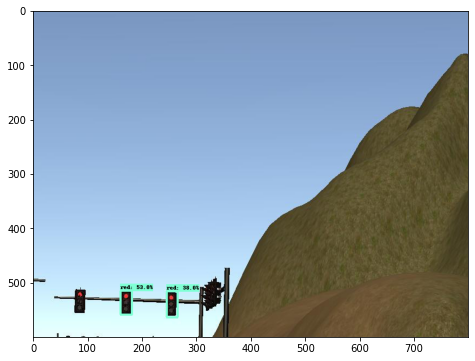

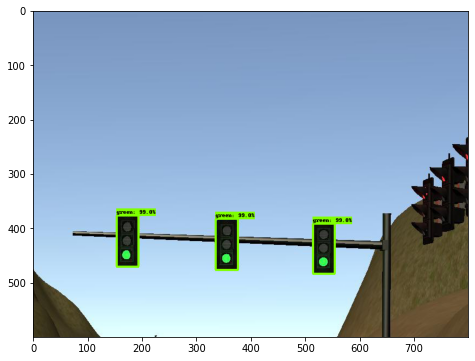

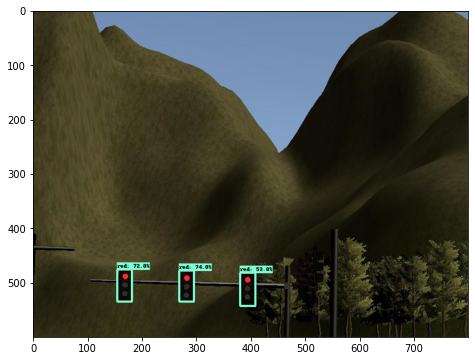

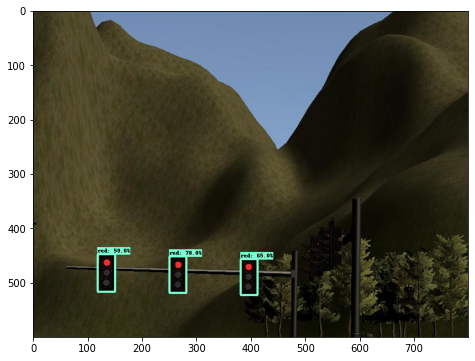

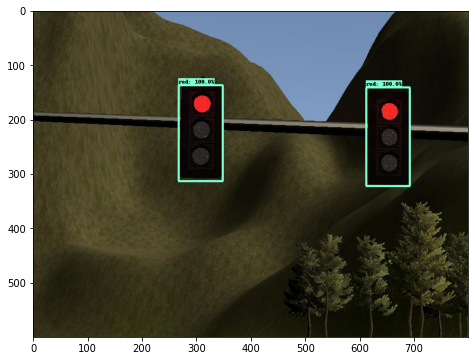

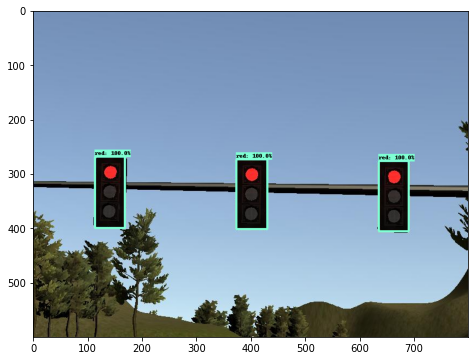

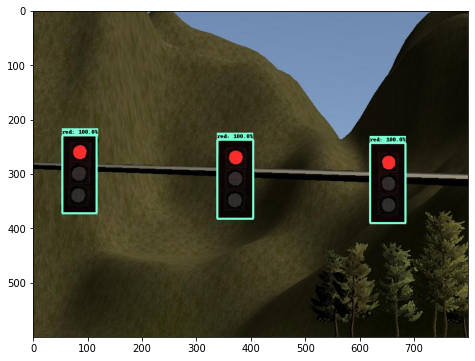

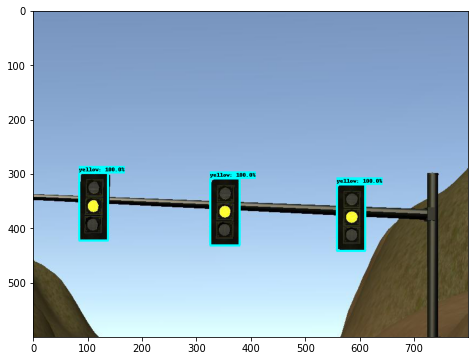

In [43]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
# This is needed to display the images.
%matplotlib inline

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=20,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize = (8,6))
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()